In [1]:
!pip install tensorflow_ranking fastdtw tensorflow_probability

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 150.4/150.4 kB 17.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 kB 29.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.7/6.7 MB 50.3 MB/s eta 0:00:00:00:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 50.7 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 153.0/153.0 kB 29.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 585.9/585.9 MB 2.8 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 60.4 MB/s eta 0:00:00:00:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 70.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 440.7/440.7 kB 58.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 68

In [2]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt

import tensorflow as tf
import tensorflow_ranking as tfr
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense, Flatten, LSTM, Permute, Conv1D, MaxPooling1D, Conv2D, MaxPooling2D, Reshape, Dropout

from keras.regularizers import l2, l1
from keras.optimizers import Adam

import sklearn
from sklearn.decomposition import PCA
from sklearn.utils import class_weight
from sklearn.metrics import f1_score
from sklearn.utils import shuffle
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC

import pickle

from VAE import Sampling, VAE, get_auth_model_from_latent_space, get_decoder, get_encoder
from WAE import WAE, get_decoder as get_decoder_wae, get_encoder as get_encoder_wae
from scaler import CustomScaler

from visualise import *


2023-04-24 13:36:54.630051: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-24 13:36:55.841973: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-04-24 13:36:55.842111: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-04-24 13:36:55.842124: W tensorfl

In [3]:
tf.get_logger().setLevel('ERROR')

device_name = tf.test.gpu_device_name()
print(device_name)

file_name = "raw_with_maps" # or offsets_2

x_data = np.load(f"data/processed/x_{file_name}_filtered.npy")[:,:,[0,1,2,4,5,6]]
print(x_data.shape)

#from featurize import filter as _filter, ORDER, CUTOFF, FILTER_INDICES
#x_data = _filter(x_data, FILTER_INDICES, ORDER, CUTOFF)

y_user = np.load(f"data/processed/y_user_{file_name}.npy")
y_intent = np.load(f"data/processed/y_intent_{file_name}.npy").astype(int)
y_gesture = np.load(f"data/processed/y_gesture_type_{file_name}.npy")

train_gesture_map = np.load(f"data/processed/train_gesture_map_{file_name}.npy").astype(int)
test_gesture_map = np.load(f"data/processed/test_gesture_map_{file_name}.npy").astype(int)



_map = (train_gesture_map == 1) #& ((y_user.argmax(axis=1) >= 14))

user_x = x_data[_map]
user_y = y_user.argmax(axis=1)[_map]

def show_visuals(vae, is_wae=False, user_x = user_x, user_y=user_y, top_5 = False):
    
    #plot_standard_devs(vae, vae.scaler.transform(user_x), user_y)
    
    plot_label_clusters(vae, vae.scaler.transform(user_x), user_y, is_wae=is_wae, top_5=top_5)
    visualise(vae, vae.scaler.transform(user_x), user_y, 10, is_wae=is_wae, top_5=top_5)
    plot_reconstructed_curves(vae, vae.scaler.transform(user_x), channel=0, is_wae=is_wae)

def stitch_histories(history1, history2):
    for key in history1:
        history1[key] += list(history2[key])
    return history1


/device:GPU:0
(34255, 200, 6)


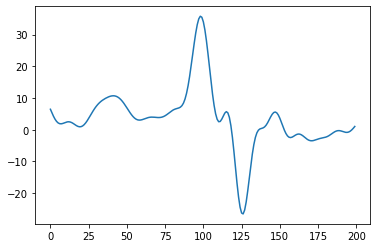

In [4]:
plt.plot(x_data[0,:,-1])

In [ ]:
beta = 1e-4
alpha = 1e-2

latent_dim = 10

name = f"vae_final_10" #WAE: beta = 1e-3, alpha= 1e-2 | VAE: beta = 1e-4, alpha = 1e-2

encoder = get_encoder(latent_dim)
decoder = get_decoder(latent_dim)
auth = get_auth_model_from_latent_space(latent_dim)

wae = VAE(encoder, decoder, None, auth, scale_included=True, use_stats=True, loss_func="LB_KEOGH_mod")
wae.fit_scaler(x_data[train_gesture_map==1])
wae.alpha = alpha
"""
wae.auth_on = False
wae.wae_loss_on = False

initial_map = ((train_gesture_map==1)) | (y_intent == 0)
train_data = wae.scaler.transform(x_data[initial_map])
opt = keras.optimizers.Adam()

wae.compile(Adam(learning_rate=1e-4))
history1 = wae.fit(train_data, y_user[initial_map], epochs=10, batch_size=128, validation_split=0.1, verbose = 0)

wae.save_model(f"Gen", name)

show_visuals(wae, True)
"""
specific_map = (train_gesture_map==1)

np.random.seed(42)
kFold = sklearn.model_selection.StratifiedKFold(n_splits=10, shuffle=True)
val_map = next(kFold.split(x_data[specific_map], y_user[specific_map].argmax(axis=1) ))[1]
val_map_all = np.zeros(len(x_data[specific_map]))
val_map_all[val_map] = 1
val_map = val_map_all == 1

train_data_x = wae.scaler.transform(x_data[specific_map][~val_map])
train_data_y = y_user[specific_map][~val_map]

val_data_x = wae.scaler.transform(x_data[specific_map][val_map])
val_data_y = y_user[specific_map][val_map]


early_stopping_callback = tf.keras.callbacks.EarlyStopping(monitor='val_total_loss', start_from_epoch=150,
                                                            patience=150, restore_best_weights=True)

wae.beta = beta
wae.auth_on = True
wae.wae_loss_on = True
wae.compile(Adam(learning_rate=1e-4)) # 1e-5 takes ages
history2 = wae.fit(train_data_x, train_data_y, epochs=2000, batch_size=128, verbose=1,
                  validation_data=(val_data_x, val_data_y),
                 #callbacks=[early_stopping_callback]
                  )
show_visuals(wae, False, top_5=True)

wae.save_model(f"Gen", name)

with open(f"data/losses/Gen/{name}.pickle", "wb") as file:
    #history = stitch_histories(history1.history, history2.history)
    history = history2.history
    pickle.dump(history, file)

Epoch 1/2000
17/17 [==============================] - 30s 354ms/step - total_loss: 0.6033 - reconstruction_loss: 0.0146 - kl_loss: 0.0079 - classification_loss: 0.0000e+00 - feature_loss: 0.5899 - reencoding_loss: 0.0000e+00 - auth_loss: -0.1190 - val_total_loss: 0.5269 - val_reconstruction_loss: 0.0177 - val_kl_loss: 0.0047 - val_feature_loss: 0.5104 - val_auth_loss: -0.1226
Epoch 2/2000
17/17 [==============================] - 1s 54ms/step - total_loss: 0.4755 - reconstruction_loss: 0.0146 - kl_loss: 0.0050 - classification_loss: 0.0000e+00 - feature_loss: 0.4621 - reencoding_loss: 0.0000e+00 - auth_loss: -0.1195 - val_total_loss: 0.4975 - val_reconstruction_loss: 0.0178 - val_kl_loss: 0.0079 - val_feature_loss: 0.4809 - val_auth_loss: -0.1173
Epoch 3/2000
17/17 [==============================] - 1s 61ms/step - total_loss: 0.4455 - reconstruction_loss: 0.0146 - kl_loss: 0.0081 - classification_loss: 0.0000e+00 - feature_loss: 0.4321 - reencoding_loss: 0.0000e+00 - auth_loss: -0.1192 

dict_keys(['total_loss', 'reconstruction_loss', 'wae_loss', 'classification_loss', 'feature_loss', 'reencoding_loss', 'auth_loss', 'val_total_loss', 'val_reconstruction_loss', 'val_wae_loss', 'val_feature_loss', 'val_auth_loss'])


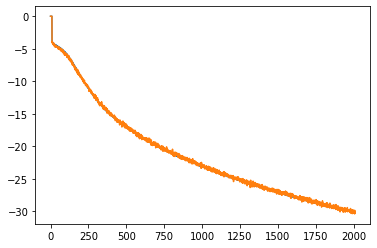

75/75 [==============================] - 1s 7ms/step


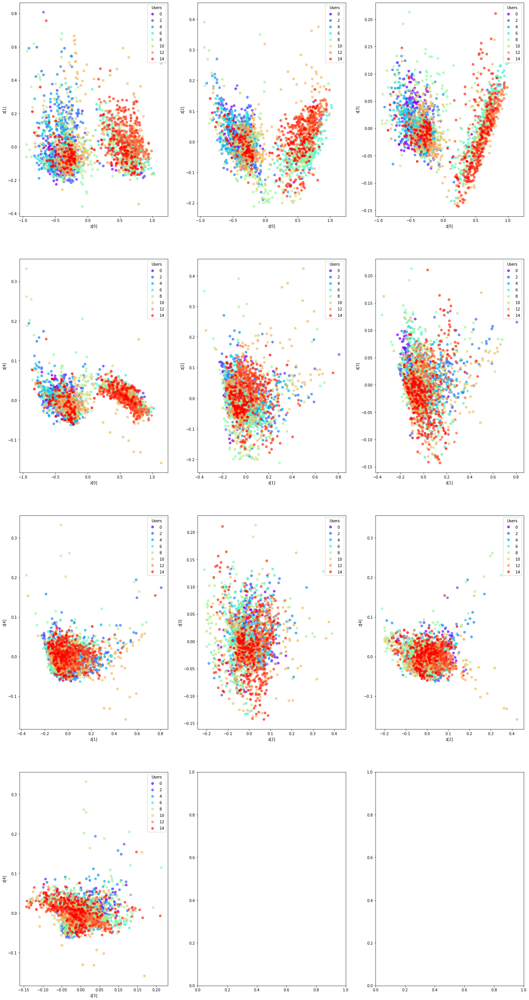

75/75 [==============================] - 1s 8ms/step


/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


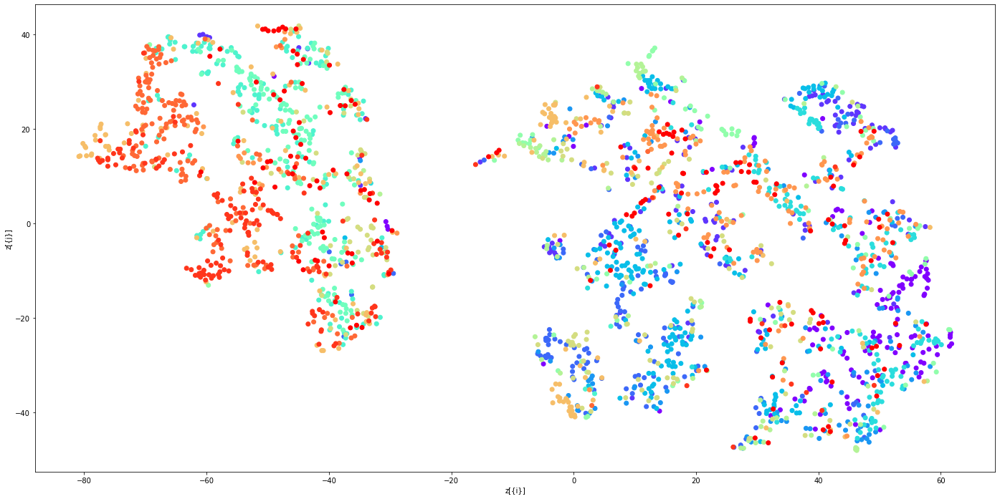

1/1 [==============================] - 0s 38ms/step


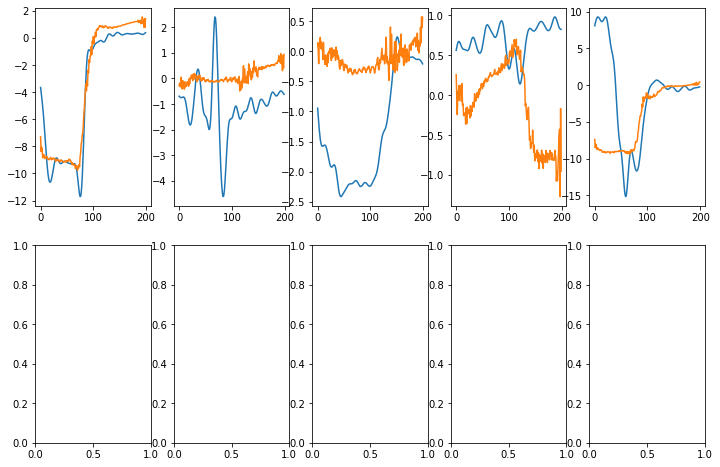

In [13]:
losses = history
print(losses.keys())
plt.plot(losses["wae_loss"])
plt.plot(losses["val_wae_loss"])
plt.show()

show_visuals(wae,True,  top_5=True) # wae.scaler.inverse_transform(val_data_x), val_data_y.argmax(axis=1),

auth user is 8
75/75 [==============================] - 2s 7ms/step


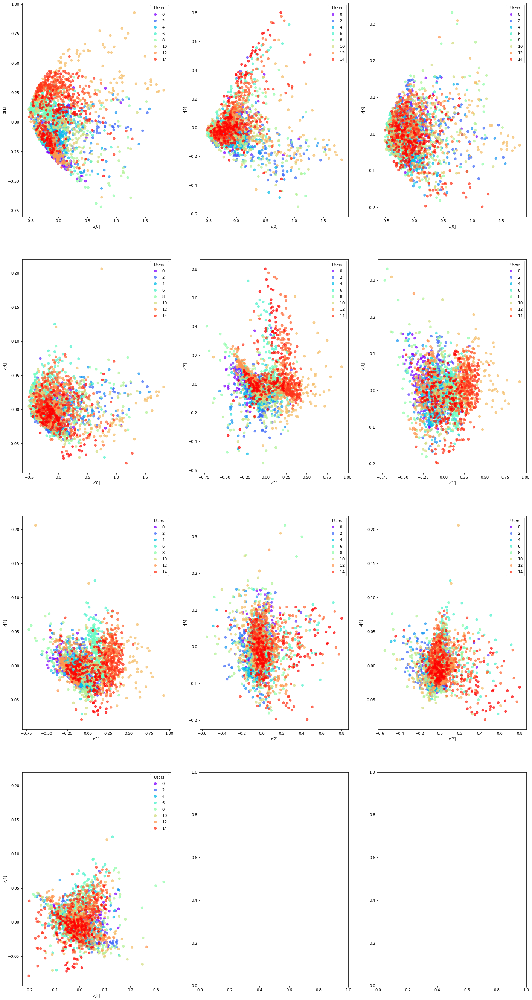

75/75 [==============================] - 1s 8ms/step


/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


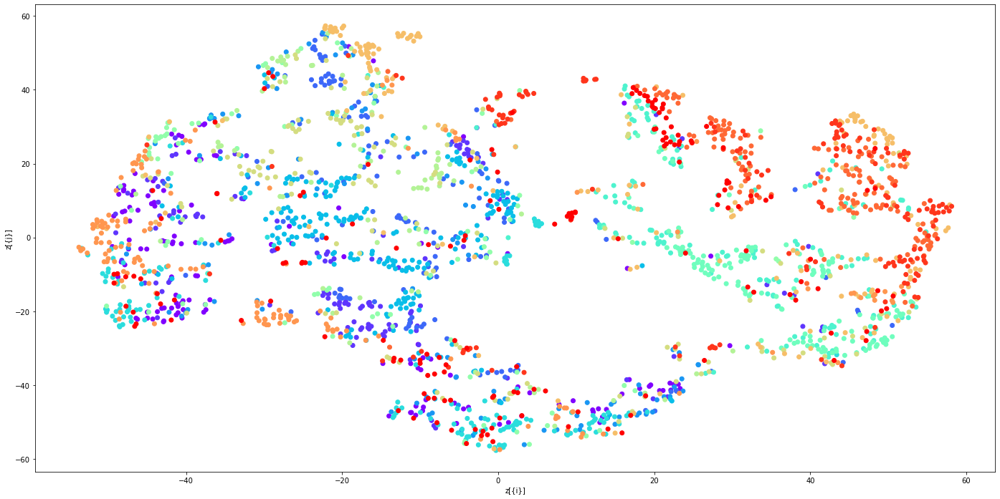

1/1 [==============================] - 0s 28ms/step


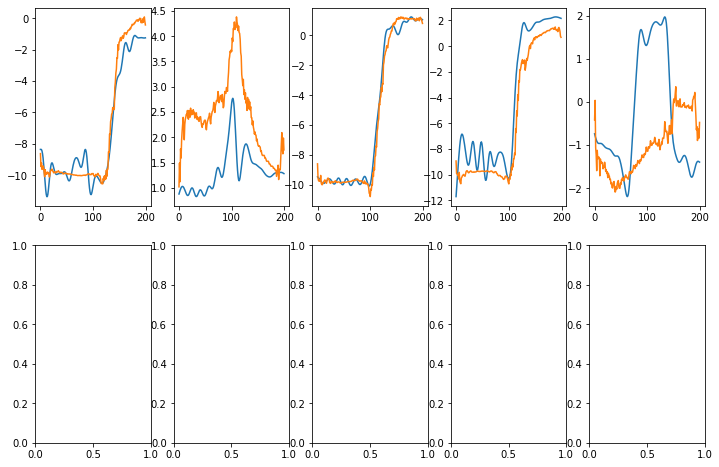

time taken 1870.7594919204712
auth user is 9
75/75 [==============================] - 2s 6ms/step


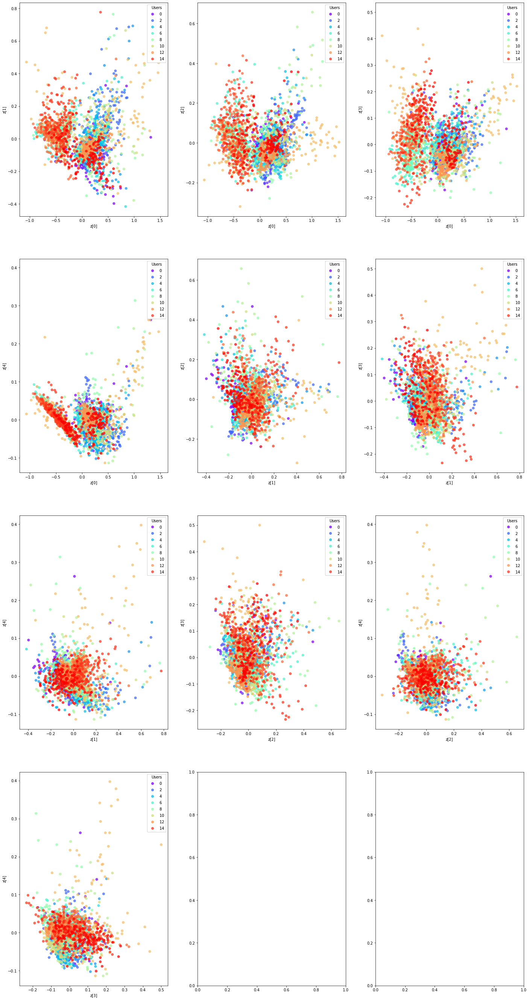

75/75 [==============================] - 1s 7ms/step


/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


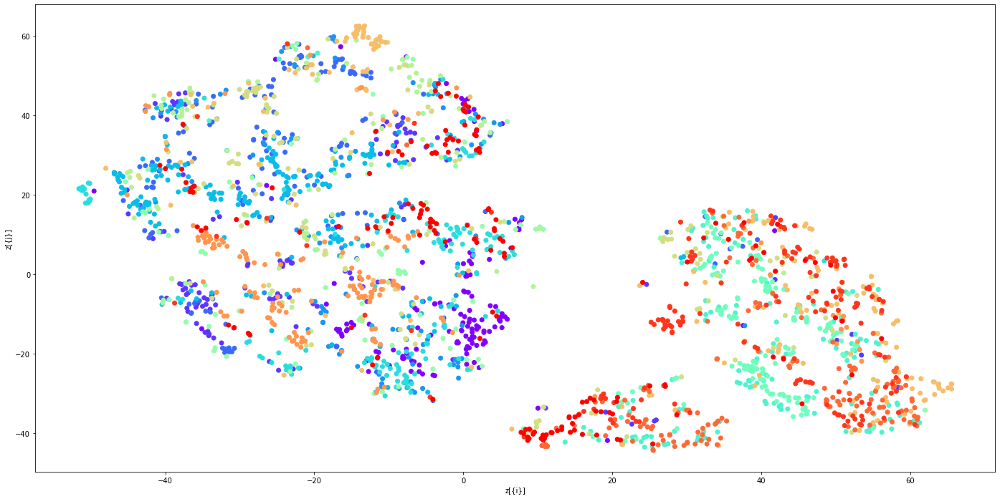

1/1 [==============================] - 0s 30ms/step


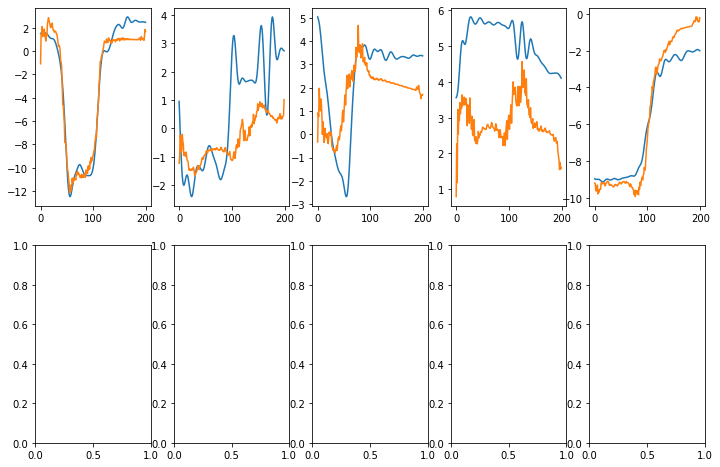

time taken 1922.0476858615875
auth user is 10
75/75 [==============================] - 2s 6ms/step


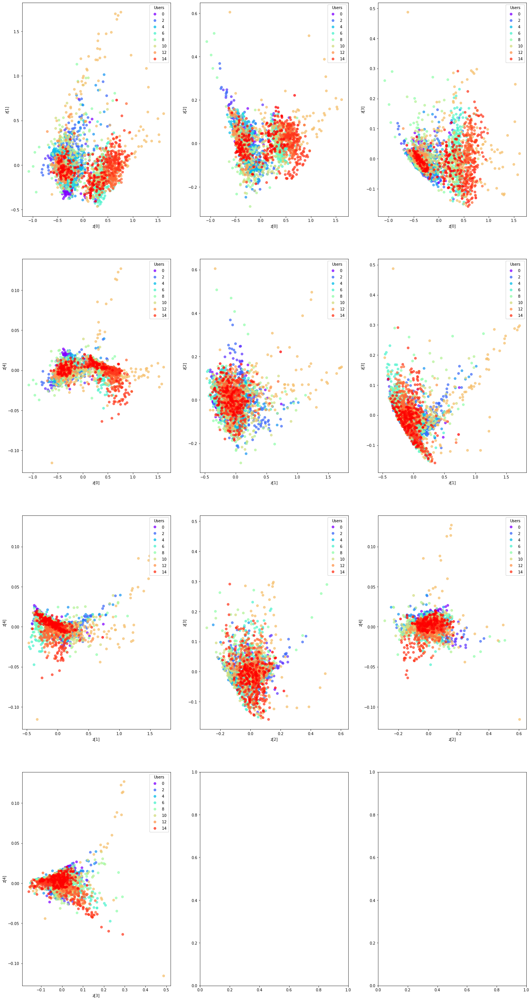

75/75 [==============================] - 0s 6ms/step


/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


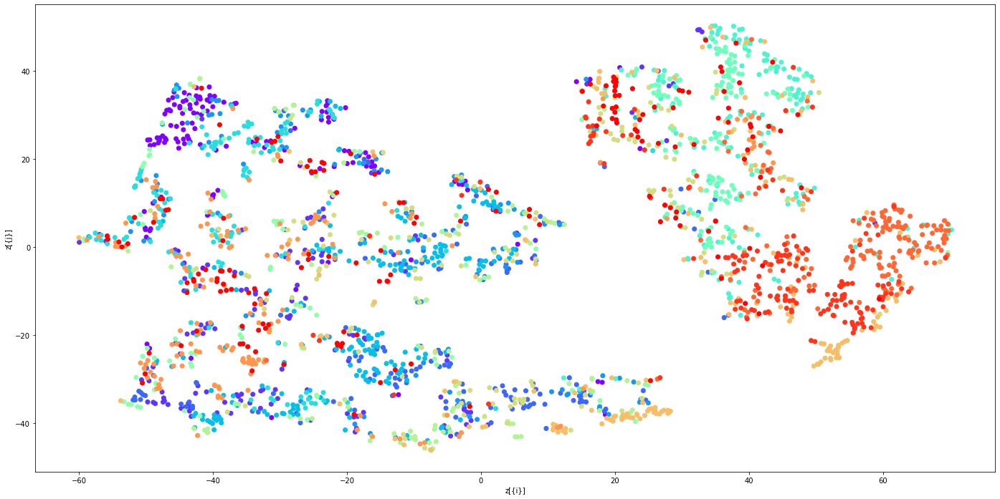

1/1 [==============================] - 0s 29ms/step


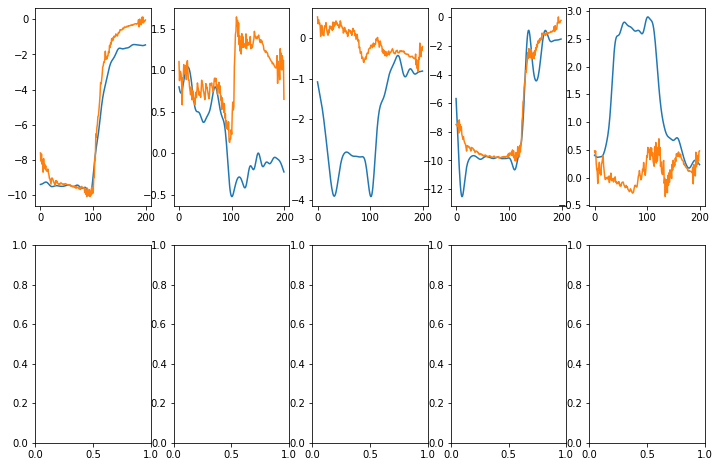

time taken 1254.5955691337585
auth user is 11
75/75 [==============================] - 2s 6ms/step


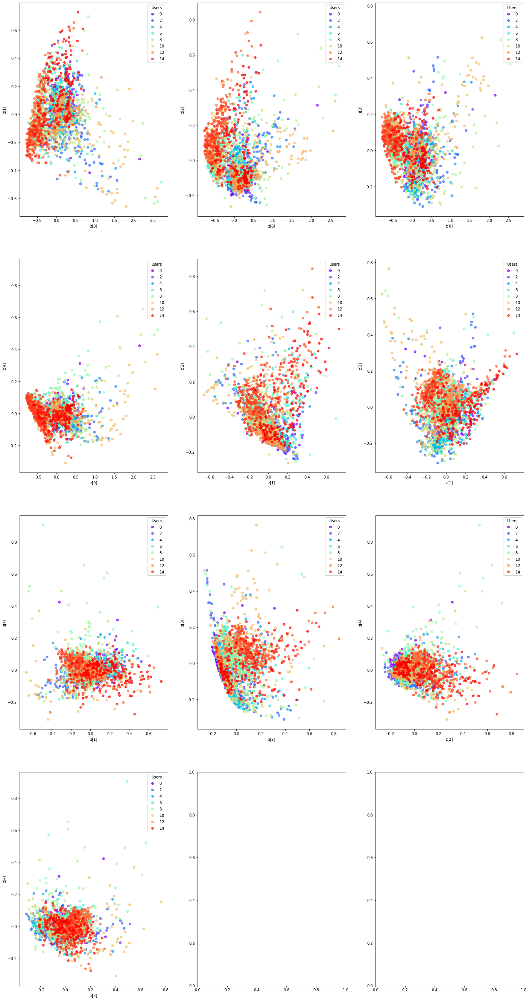

75/75 [==============================] - 1s 8ms/step


/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


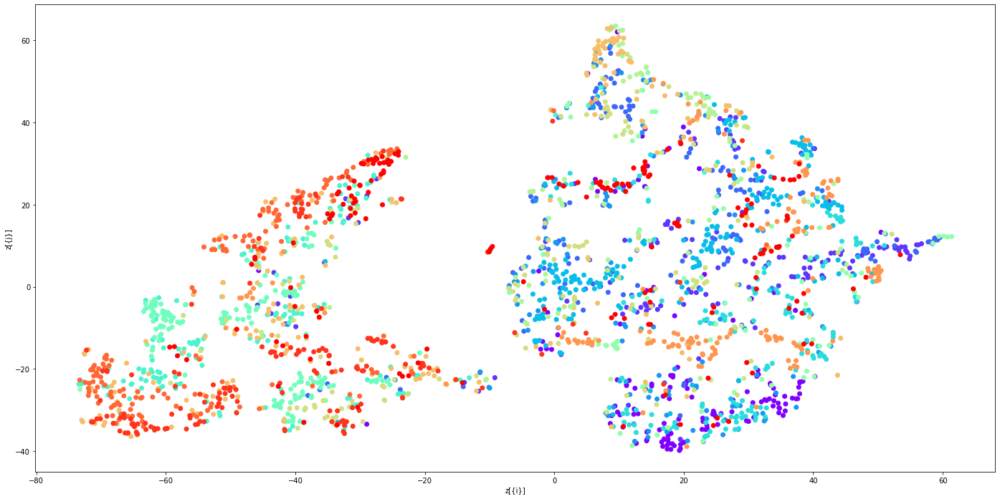

1/1 [==============================] - 0s 30ms/step


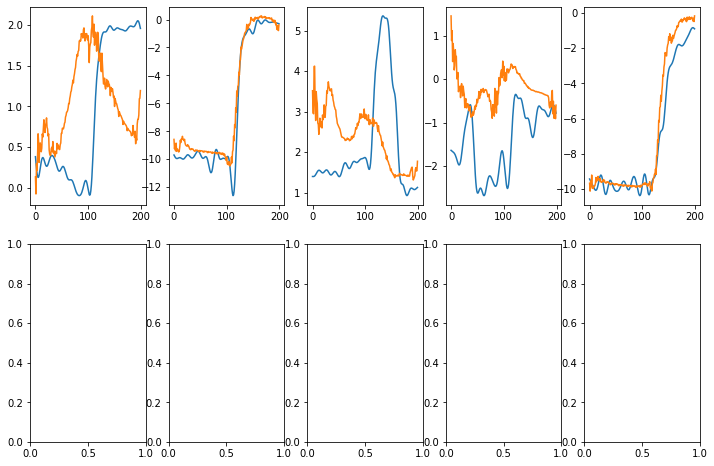

time taken 1504.831384897232
auth user is 12
75/75 [==============================] - 2s 7ms/step


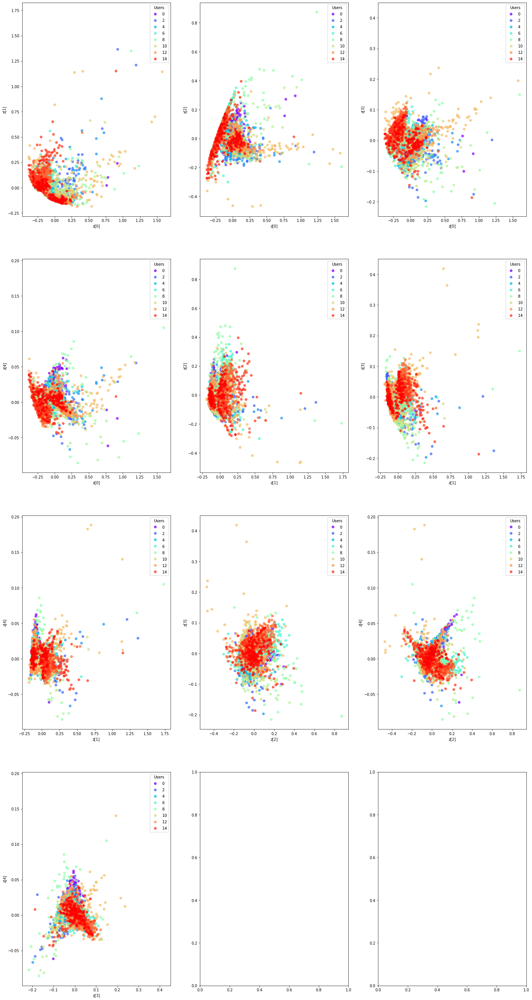

75/75 [==============================] - 1s 8ms/step


/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


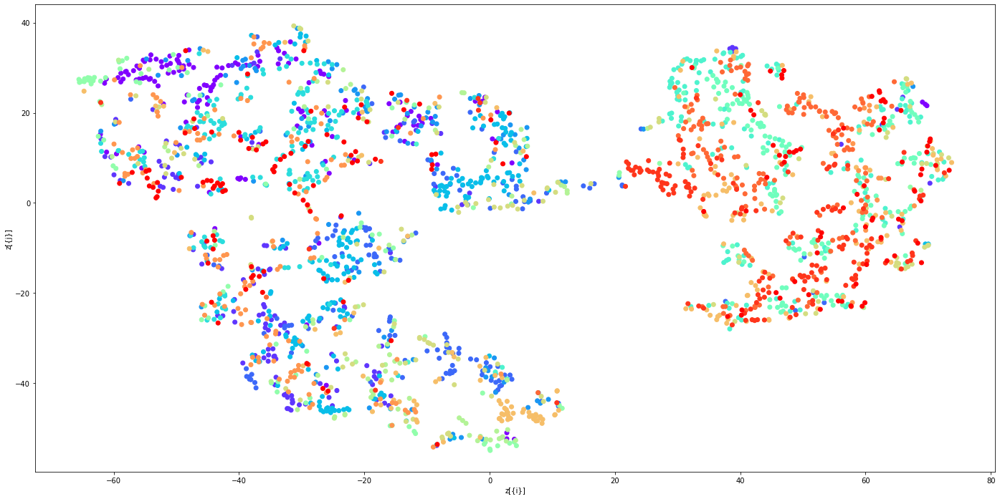

1/1 [==============================] - 0s 28ms/step


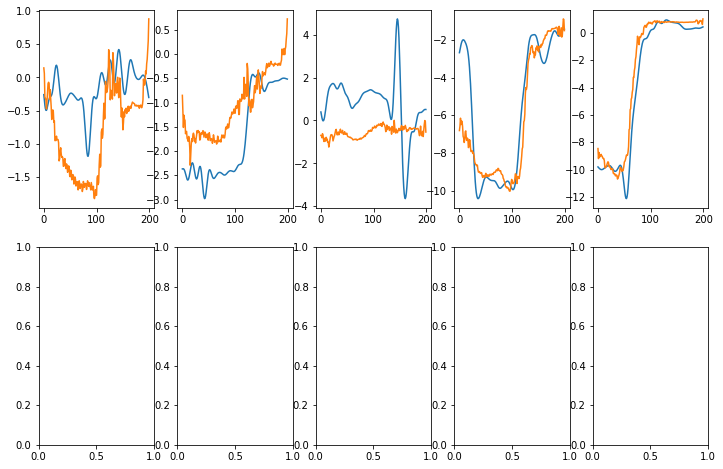

time taken 1827.2571437358856
auth user is 13
75/75 [==============================] - 2s 8ms/step


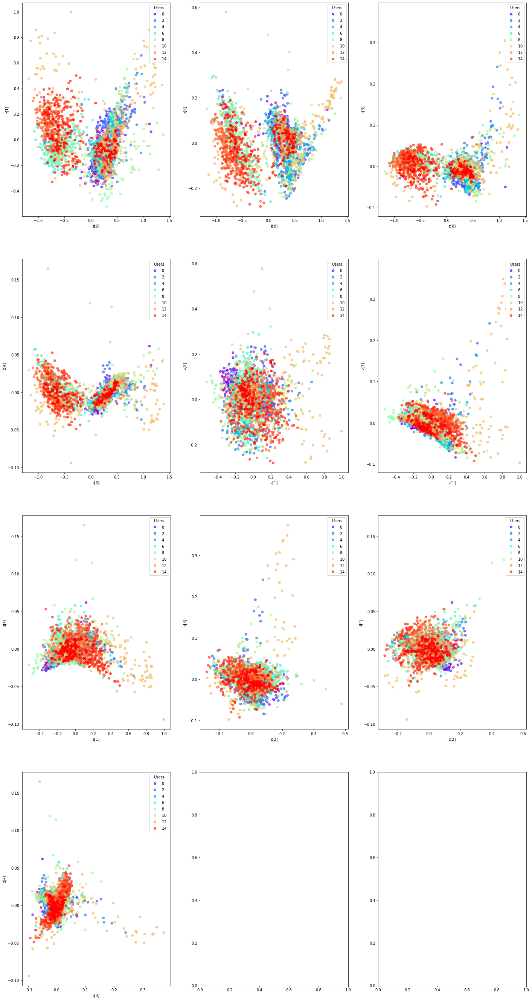

75/75 [==============================] - 0s 6ms/step


/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


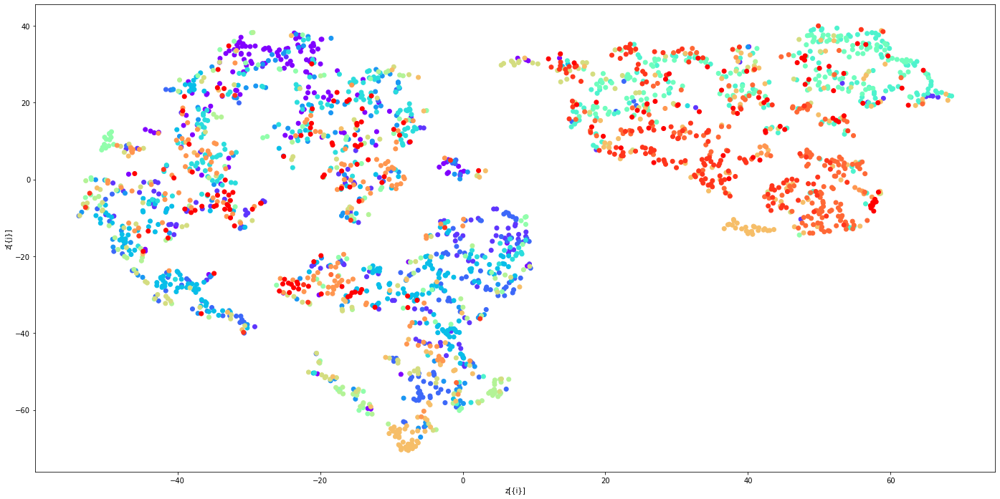

1/1 [==============================] - 0s 26ms/step


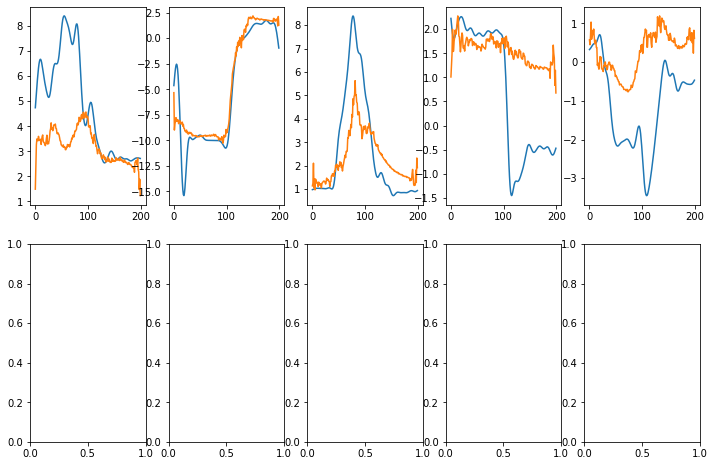

time taken 988.4298045635223
auth user is 14
75/75 [==============================] - 2s 8ms/step


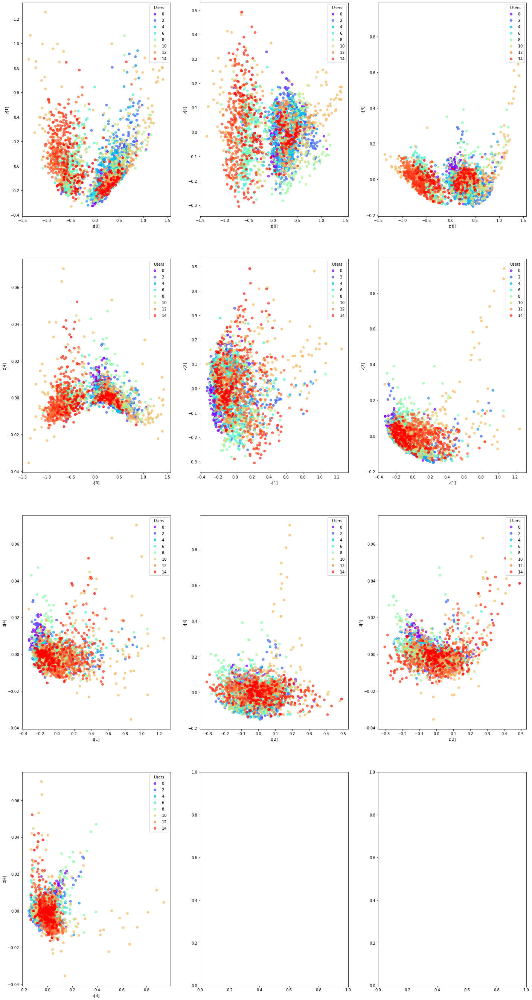

75/75 [==============================] - 1s 8ms/step


/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


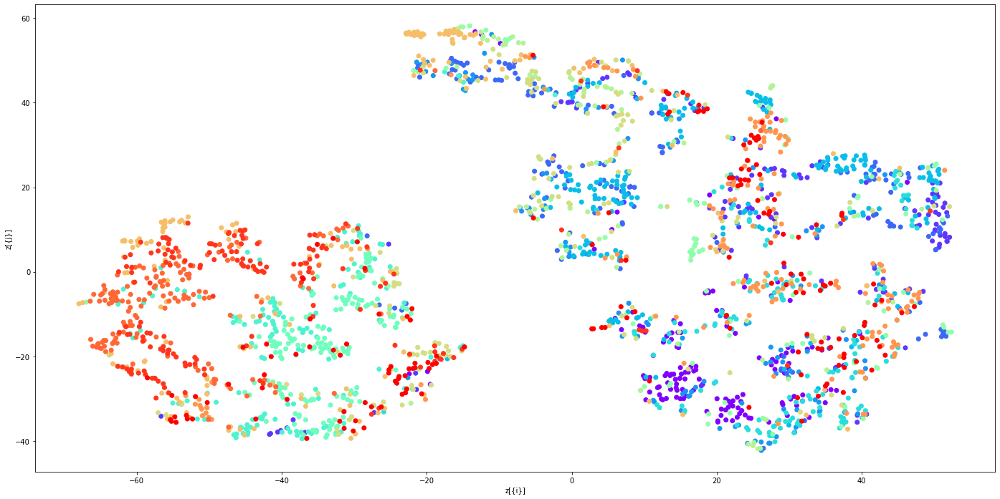

1/1 [==============================] - 0s 26ms/step


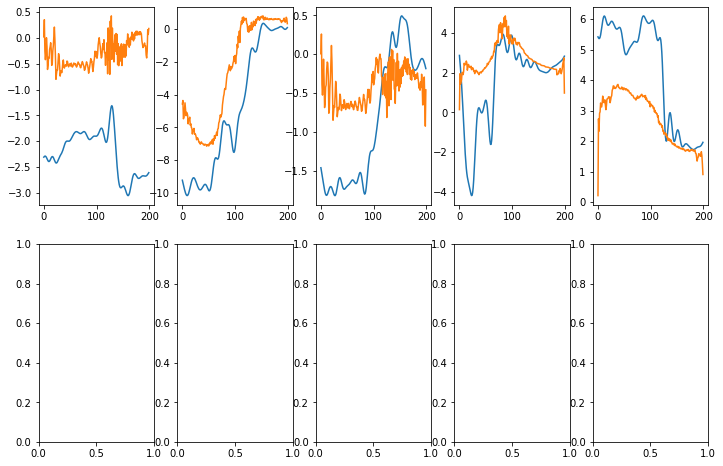

time taken 1160.7480735778809
auth user is 15
75/75 [==============================] - 2s 7ms/step


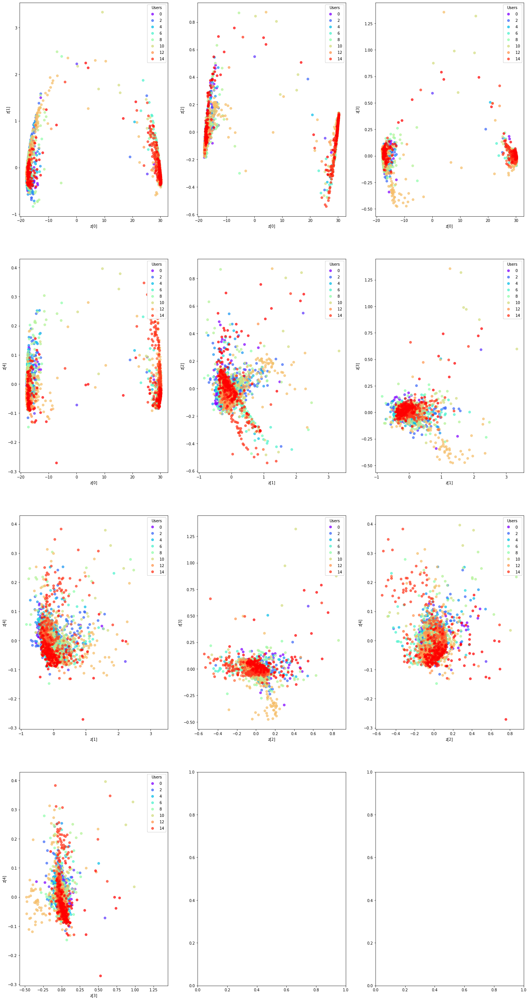

75/75 [==============================] - 1s 7ms/step


/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


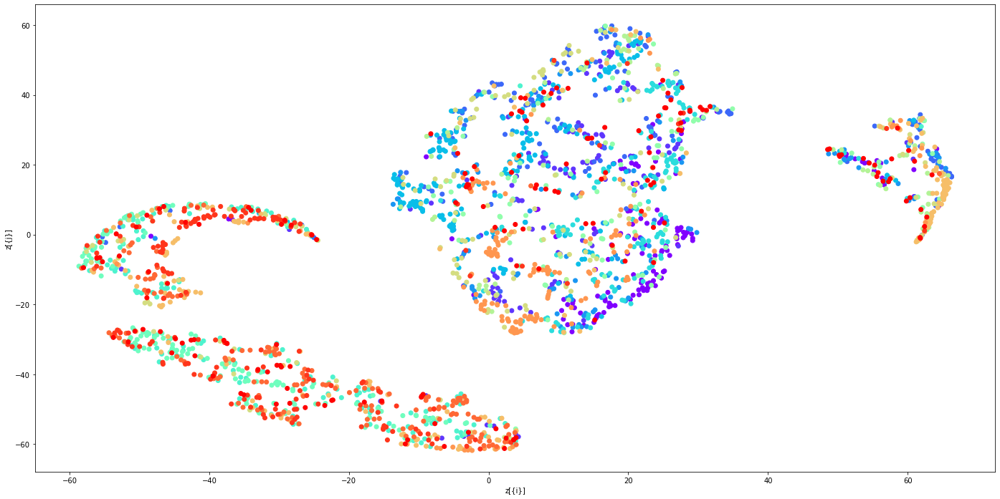

1/1 [==============================] - 0s 30ms/step


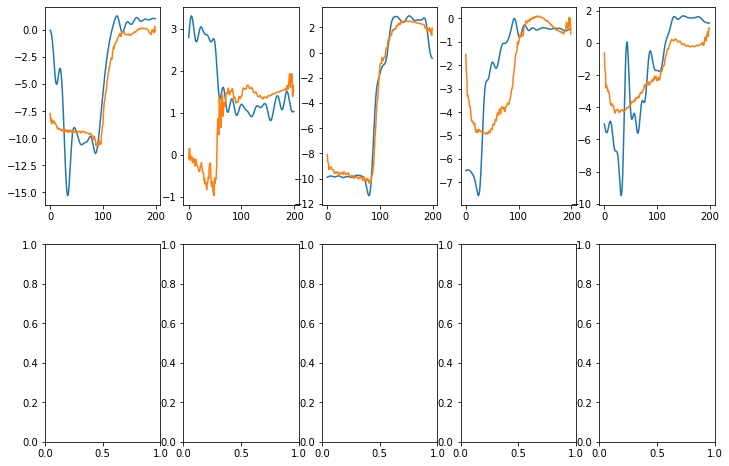

time taken 1792.3773555755615


In [5]:
import time
beta = 1e-3
alpha = 1e-2
gamma = 1e-2
latent_dim = 10
for auth_user in range(8,16):
    start = time.time()
    print(f"auth user is {auth_user}")
    
    name = f"wae_final_10"

    encoder = get_encoder_wae(latent_dim)
    decoder = get_decoder_wae(latent_dim)
    auth = get_auth_model_from_latent_space(latent_dim)

    wae = WAE(encoder, decoder, None, auth, scale_included=True, use_stats=True)
    wae.fit_scaler(x_data[(train_gesture_map==1)])
    wae.alpha = alpha
    wae.beta = beta
    wae.gamma = gamma
    
    specific_map = (train_gesture_map==1) & (y_user.argmax(axis=1) != auth_user)
    
    np.random.seed(42)
    kFold = sklearn.model_selection.StratifiedKFold(n_splits=10, shuffle=True)
    val_map = next(kFold.split(x_data[specific_map], y_user[specific_map].argmax(axis=1) ))[1]
    val_map_all = np.zeros(len(x_data[specific_map]))
    val_map_all[val_map] = 1
    val_map = val_map_all == 1
    
    train_data_x = wae.scaler.transform(x_data[specific_map][~val_map])
    train_data_y = y_user[specific_map][~val_map]

    val_data_x = wae.scaler.transform(x_data[specific_map][val_map])
    val_data_y = y_user[specific_map][val_map]


    early_stopping_callback = tf.keras.callbacks.EarlyStopping(monitor='val_total_loss', start_from_epoch=150,
                                                                patience=150, restore_best_weights=True)

    wae.auth_on = True
    wae.wae_loss_on = True
    wae.compile(Adam(learning_rate=1e-4)) # 1e-5 takes ages
    history = wae.fit(train_data_x, train_data_y, epochs=2000, batch_size=128, verbose=0,
                      validation_data=(val_data_x, val_data_y),
                     callbacks=[early_stopping_callback])
    
    show_visuals(wae, True, top_5=True)

    wae.save_model(f"Gen/user={auth_user}", name)

    with open(f"data/losses/Gen/user={auth_user}/{name}.pickle", "wb") as file:
        history = history.history
        pickle.dump(history, file)
        
    print("time taken", time.time() - start)

dict_keys(['total_loss', 'reconstruction_loss', 'wae_loss', 'classification_loss', 'feature_loss', 'reencoding_loss', 'auth_loss', 'val_total_loss', 'val_reconstruction_loss', 'val_wae_loss', 'val_feature_loss', 'val_auth_loss'])


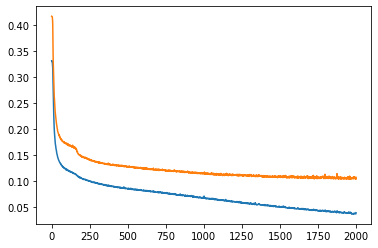

75/75 [==============================] - 0s 6ms/step


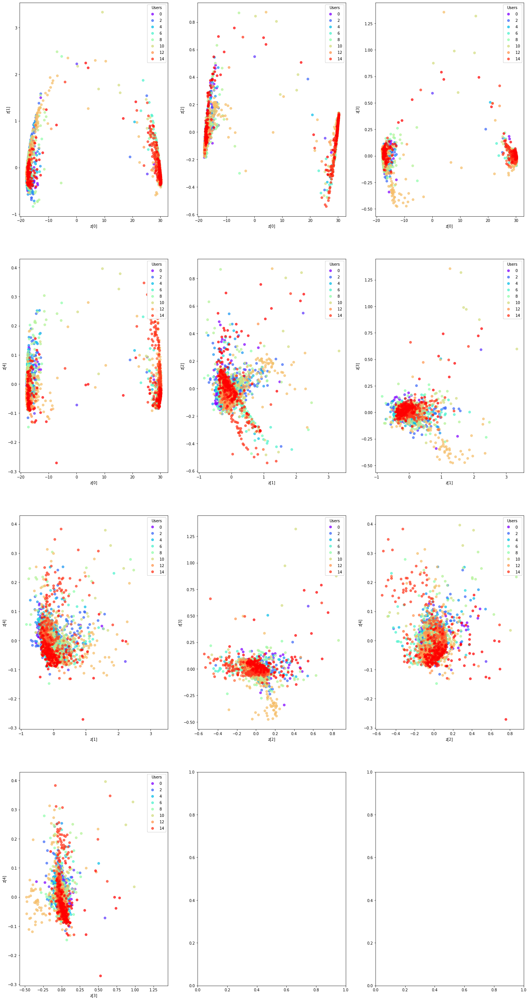

75/75 [==============================] - 0s 6ms/step


/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


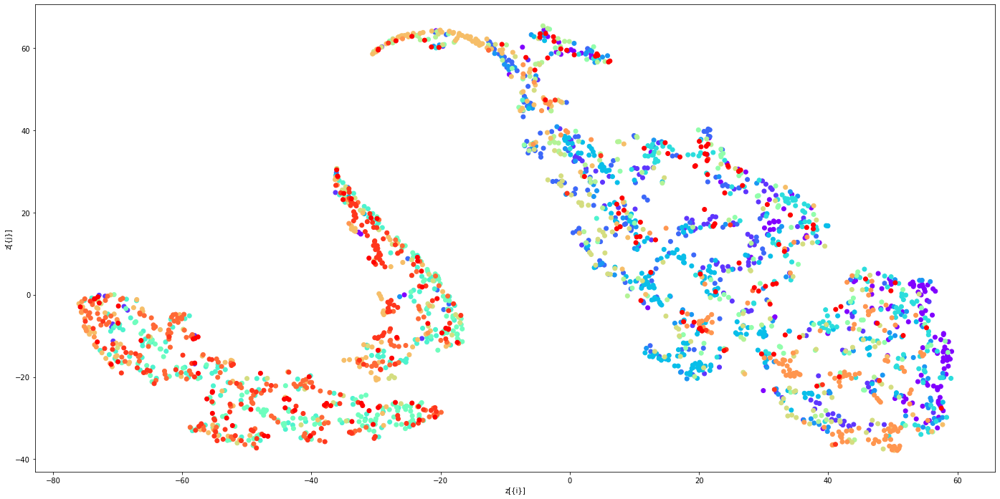

1/1 [==============================] - 0s 27ms/step


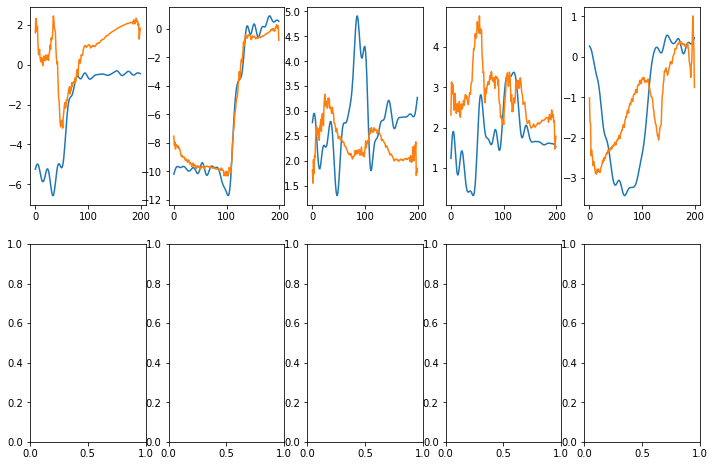

In [6]:
losses = history
print(losses.keys())
plt.plot(losses["total_loss"])
plt.plot(losses["val_total_loss"])
plt.show()

show_visuals(wae,True,  top_5=True) # wae.scaler.inverse_transform(val_data_x), val_data_y.argmax(axis=1),

In [4]:
import time
beta = 1e-4
alpha = 1e-2
gamma = 1e-2
latent_dim = 50
for auth_user in range(16):
    start = time.time()
    print(f"auth user is {auth_user}")
    
    name = f"vae_final_50"
    
    encoder = get_encoder(latent_dim)
    decoder = get_decoder(latent_dim)
    auth = get_auth_model_from_latent_space(latent_dim)

    vae = VAE(encoder, decoder, None, auth, scale_included=True, use_stats=True, loss_func = "LB_KEOGH_mod")
    vae.fit_scaler(x_data[(train_gesture_map==1)])
    vae.alpha = alpha
    vae.beta = beta
    vae.gamma = gamma
    
    
    
    specific_map = (train_gesture_map==1) & (y_user.argmax(axis=1) != auth_user)
    
    np.random.seed(42)
    kFold = sklearn.model_selection.StratifiedKFold(n_splits=10, shuffle=True)
    val_map = next(kFold.split(x_data[specific_map], y_user[specific_map].argmax(axis=1) ))[1]
    val_map_all = np.zeros(len(x_data[specific_map]))
    val_map_all[val_map] = 1
    val_map = val_map_all == 1
    
    train_data_x = vae.scaler.transform(x_data[specific_map][~val_map])
    train_data_y = y_user[specific_map][~val_map]

    val_data_x = vae.scaler.transform(x_data[specific_map][val_map])
    val_data_y = y_user[specific_map][val_map]


    early_stopping_callback = tf.keras.callbacks.EarlyStopping(monitor='val_total_loss', start_from_epoch=150,
                                                                patience=150, restore_best_weights=True)

    vae.auth_on = True
    vae.vae_loss_on = True
    vae.compile(Adam(learning_rate=1e-4)) # 1e-5 takes ages
    history = vae.fit(train_data_x, train_data_y, epochs=2000, batch_size=128, verbose=0,
                      validation_data=(val_data_x, val_data_y),
                     callbacks=[early_stopping_callback])
    
    show_visuals(vae, False, top_5=True)

    vae.save_model(f"Gen/user={auth_user}", name)

    with open(f"data/losses/Gen/user={auth_user}/{name}.pickle", "wb") as file:
        history = history.history
        pickle.dump(history, file)
        
    print("time taken", time.time() - start)

auth user is 0


2023-04-24 10:39:26.262580: W tensorflow/tsl/framework/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 1.40GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2023-04-24 10:39:26.559172: W tensorflow/tsl/framework/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 1.40GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2023-04-24 10:39:26.562215: W tensorflow/tsl/framework/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 1.40GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2023-04-24 10:39:26.565402: W tensorflow/tsl/framework/bfc_allocator.cc:290] Allocator (GPU

InternalError: Graph execution error:

Failed to call ThenRnnForward with model config: [rnn_mode, rnn_input_mode, rnn_direction_mode]: 3, 0, 0 , [num_layers, input_size, num_units, dir_count, max_seq_length, batch_size, cell_num_units]: [1, 30, 32, 1, 13, 128, 0] 
	 [[{{node CudnnRNN}}]]
	 [[encoder/gru/PartitionedCall]] [Op:__inference_train_function_28622]

In [ ]:
first_time = True
for latent_dim in [10]: # , 30, 10, 100]: # 500, 50, 40, 30, 20, 10
    
    """
    if first_time:
        encoder = get_encoder(latent_dim)
        decoder = get_decoder(latent_dim)
        #auth = get_auth_model_from_latent_space(latent_dim)

        vae = VAE(encoder, decoder, None, None, scale_included=True, loss_func="MSE")
        vae.fit_scaler(x_data[(y_intent==0)])
        vae.auth_on = False
        
        show_visuals(vae)

        initial_map = (train_gesture_map==1) | (y_intent == 0)
        train_data = vae.scaler.transform(x_data[initial_map])

        print("Fitting basic")

        vae.beta = 1e-4
        vae.compile(Adam())
        history_1 = vae.fit(train_data, y_user[initial_map], epochs=100, batch_size=128, verbose=1)
        vae.save_model(f"Gen", f"all_users_filtered_basic_reconstruction_mse_{latent_dim}")
    """
    
    specific_map = (train_gesture_map==1) 
    vae = VAE(None, None, None, None, loss_func="LB_KEOGH")
    vae.load_model(f"Gen", f"all_users_filtered_basic_reconstruction_mse_{latent_dim}")

    #show_visuals(vae)
    
    beta = 1e-4
    vae.beta = beta
    vae.alpha = 0.01
    vae.auth_on = False

    vae.compile(Adam())

    train_data = vae.scaler.transform(x_data[specific_map])
    
    history_2 = vae.fit(train_data, y_user[specific_map], epochs=2000, batch_size=128, verbose=1)

    history = history_1.history
    history = stitch_histories(history, history_2.history)


    """
    beta = 1e-2
    vae.beta = beta
    vae.alpha = 0.5
    vae.auth_on = True
    print("Fitting specific - higher auth")
    
    vae.fit(train_data, y_user[specific_map], epochs=1000, batch_size=128, verbose=1)
    
    show_visuals(vae)
    """
    
    name = f"all_users_filtered_specifically_trained_mse_{latent_dim}"
    
    vae.save_model(f"Gen", f"all_users_filtered_specifically_trained_mse_{latent_dim}")
    
    with open(f"data/losses/Gen/{name}.pickle", "wb") as file:
        pickle.dump(history, file)

In [7]:

print(history.keys())
plt.plot(history["loss"])
#plt.yscale("log")

AttributeError: 'History' object has no attribute 'keys'

In [ ]:
show_visuals(vae)

z_pca = vae.encoder(vae.scaler.transform(x_data[train_gesture_map == 1]))[2]

labels = y_user.argmax(axis=1)[train_gesture_map == 1]

print(z_pca.shape)
    
comps = 5

pair_set = [(i,j) for i in range(comps) for j in range(i+1,comps)]

fig, ax = plt.subplots(1 + len(pair_set)//3,3, figsize=(24,48))

for ix, (i,j) in enumerate(pair_set):
    scatter = ax[divmod(ix, 3)].scatter(z_pca[:, i], z_pca[:, j], c=labels, alpha=0.7, cmap = "rainbow")
    ax[divmod(ix, 3)].set_xlabel(f"z[{i}]")
    ax[divmod(ix, 3)].set_ylabel(f"z[{j}]")
    legend = ax[divmod(ix, 3)].legend(*scatter.legend_elements(),
                loc="upper right", title="Users")
    ax[divmod(ix, 3)].add_artist(legend)
#plt.colorbar()

plt.show()
a = 1/0
user_pred = vae.auth(enc)
user_labels = y_user[test_gesture_map == 1]
tf.keras.losses.CategoricalCrossentropy()(user_labels, user_pred)

relevant_pred = user_pred.numpy() * user_labels

relevant_pred = np.mean(relevant_pred, axis=1) * 6

for auth_user in range(6):

    display(sum((relevant_pred > user_pred.numpy()[:,auth_user])[y_user.argmax(axis=1)[test_gesture_map == 1] != auth_user]) / sum(test_gesture_map))

sum(user_pred.numpy().argmax(axis=1) == user_labels.argmax(axis=1)) / sum(test_gesture_map)

In [ ]:
beta = 1e-3
vae.beta = beta
vae.alpha = 0.5
vae.auth_on = True
print("Fitting specific - higher auth")

vae.compile(Adam())
    
vae.fit(train_data, y_user[specific_map], epochs=20, batch_size=128, verbose=1)
show_visuals(vae)

In [ ]:
!pip install tensorflow_ranking tensorflow_addons tensorflow_probability

In [ ]:
def show_visuals(vae):
    
    
    latent_space_means, latent_space_stds, latent_space = vae.encoder(vae.scaler.transform(user_x[:5]))
    print(latent_space_means[:,0].shape)
    plt.scatter(latent_space_means[:,0], latent_space_means[:,1], c=range(5), label="means")
    plt.scatter(latent_space[:,0], latent_space[:,1], label="sampled",c=range(5), s=10)
    
    print(latent_space_stds)

    plt.legend()
    
    plot_label_clusters(vae, vae.scaler.transform(user_x), user_y)
    visualise(vae, vae.scaler.transform(user_x), user_y, 10)
    plot_reconstructed_curves(vae, vae.scaler.transform(user_x), channel=7)

In [ ]:
latent_dim = 10
vae = VAE(None, None, None, None)
vae.load_model(f"all_users", f"high_beta_specifically_trained_{latent_dim}")

specific_map = train_gesture_map == 1

vae.beta = 1e-2
vae.compile(Adam())
train_data = vae.scaler.transform(x_data[specific_map])

for i in range(10):
    print(i)
    vae.fit(train_data, y_user[specific_map], epochs=50, batch_size=128, verbose=1)
    show_visuals(vae)

In [ ]:
latent_dim = 10



vae = VAE(None, None, None, None)
vae.load_model(f"all_users", f"high_beta_specifically_trained_{latent_dim}")

# TODO - save rest of variables in a state_dict



show_visuals(vae)